In [1]:
import sys
sys.setrecursionlimit(10000)


import scanpy as sc
#import scvelo as scv 
import scanpy.external as sce
#import cellrank as cr
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
import numpy as np
import os, scipy
import warnings
warnings.filterwarnings("ignore")
import matplotlib.pyplot as pyplot

sc.set_figure_params(dpi = 150, dpi_save = 300, format = 'png')

## R interface
#from rpy2.robjects import pandas2ri
#from rpy2.robjects import r
#import rpy2.rinterface_lib.callbacks
#import anndata2ri
#import rpy2.robjects.numpy2ri
#import rpy2.robjects.numpy2ri as numpy2ri


#pandas2ri.activate()
#anndata2ri.activate()
#rpy2.robjects.numpy2ri.activate()

#%load_ext rpy2.ipython

In [3]:
### raed dv files####


d5dv = sc.read_h5ad("/home/kgr851/seurat_data_for_python/velocity/adata/raw/scvi/dv_mistr/d5dv/d5dv.velocity.raw.h5ad")
d9dv = sc.read_h5ad("/home/kgr851/seurat_data_for_python/velocity/adata/raw/scvi/dv_mistr/d9dv/d9dv.velocity.raw.h5ad")
d14dv = sc.read_h5ad("/home/kgr851/seurat_data_for_python/velocity/adata/raw/scvi/dv_mistr/d14dv/d14dv.velocity.raw.h5ad")
d21dv = sc.read_h5ad("/home/kgr851/seurat_data_for_python/velocity/adata/raw/scvi/dv_mistr/d21dv/d21dv.velocity.raw.h5ad")
d35dv = sc.read_h5ad("/home/kgr851/seurat_data_for_python/velocity/adata/raw/scvi/dv_mistr/d35dv/d35dv.velocity.raw.h5ad")

In [4]:
##############add necessary infor to sort batches##############

#########add meta data for day#########

d5dv.obs['day'] =  "day 05"
d9dv.obs['day'] =  "day 09"
d14dv.obs['day'] =  "day 14"
d21dv.obs['day'] =  "day 21"
d35dv.obs['day'] =  "day 35"

#########add meta data for tissue #########


d5dv.obs['tissue'] =  "D/V forebrain d 05"
d9dv.obs['tissue'] = "D/V forebrain d 09"
d14dv.obs['tissue'] = "D/V forebrain d 14"
d21dv.obs['tissue'] = "D/V forebrain d 21"
d35dv.obs['tissue'] = "D/V forebrain d 35"

#########add meta data for MiSTR Model #########

d5dv.obs['model'] =  "D/V forebrain"
d9dv.obs['model'] = "D/V forebrain"
d14dv.obs['model'] = "D/V forebrain"
d21dv.obs['model'] = "D/V forebrain"
d35dv.obs['model'] = "D/V forebrain"




#########add meta data for chemistry #########

d5dv.obs['chemistry'] =  "v3.0"
d9dv.obs['chemistry'] = "v3.0"
d14dv.obs['chemistry'] = "v3.0"
d21dv.obs['chemistry'] = "v3.0"
d35dv.obs['chemistry'] = "v3.0"

In [5]:
#######concatenate 
adata = d5dv.concatenate(d9dv,d14dv,d21dv,d35dv, batch_categories= ['d5dv','d9dv','d14dv','d21dv','d35dv'], join = 'outer')

In [6]:

adata.layers["counts"] = adata.X.copy()

sc.pp.normalize_total(adata, target_sum=10_000)
sc.pp.log1p(adata)
adata.raw = adata

In [7]:
adata.raw = adata  # keep full dimension safe
sc.pp.highly_variable_genes(
    adata,
    flavor="seurat_v3",
    n_top_genes=2000,
    layer = 'counts',
    batch_key='day',
    subset=False,
)

In [8]:
adata.layers['log_transformed'] = adata.X

## save the concat adata 

In [9]:
#adata.write('dv_mistr_concat_inner.h5ad')

In [2]:
adata = sc.read_h5ad('dv_mistr_concat_inner.h5ad')

In [3]:
hvg = adata.var[adata.var['highly_variable'] == True].index.to_list()
len(hvg)

2000

In [4]:
%%R -i adata -i hvg -o fastmnn_embed

Csparse_validate = "CsparseMatrix_validate"
library(Seurat)
library(batchelor)

sobj <- as.Seurat(adata, counts = NULL, data = "log_transformed")

sobj <- subset(sobj, features=hvg)

expr <- GetAssayData(sobj, slot = "data")

sce <- fastMNN(expr, batch = sobj@meta.data[['day']])

sobj@reductions['fastmnn'] <- CreateDimReducObject(reducedDim(sce, "corrected"), key = 'fastmnn_')

fastmnn_embed = Embeddings(object = sobj, reduction = "fastmnn")


    an issue that caused a segfault when used with rpy2:
    https://github.com/rstudio/reticulate/pull/1188
    Make sure that you use a version of that package that includes
    the fix.
    

The legacy packages maptools, rgdal, and rgeos, underpinning the sp package,
which was just loaded, will retire in October 2023.
Please refer to R-spatial evolution reports for details, especially
https://r-spatial.org/r/2023/05/15/evolution4.html.
It may be desirable to make the sf package available;
package maintainers should consider adding sf to Suggests:.
The sp package is now running under evolution status 2
     (status 2 uses the sf package in place of rgdal)
Attaching SeuratObject

Attaching package: ‘Seurat’

The following object is masked from ‘package:SummarizedExperiment’:

    Assays

In addition: Warning message:
In `[<-`(`*tmp*`, "fastmnn", value = list(UMAP = new("DimReduc",  :
  implicit list embedding of S4 objects is deprecated


In [11]:
adata.obsm['fastmnn'] = fastmnn_embed
sc.pp.neighbors(adata, use_rep="fastmnn")
sc.tl.umap(adata,random_state=5)
#sc.tl.leiden(adata_concat, resolution=0.8)

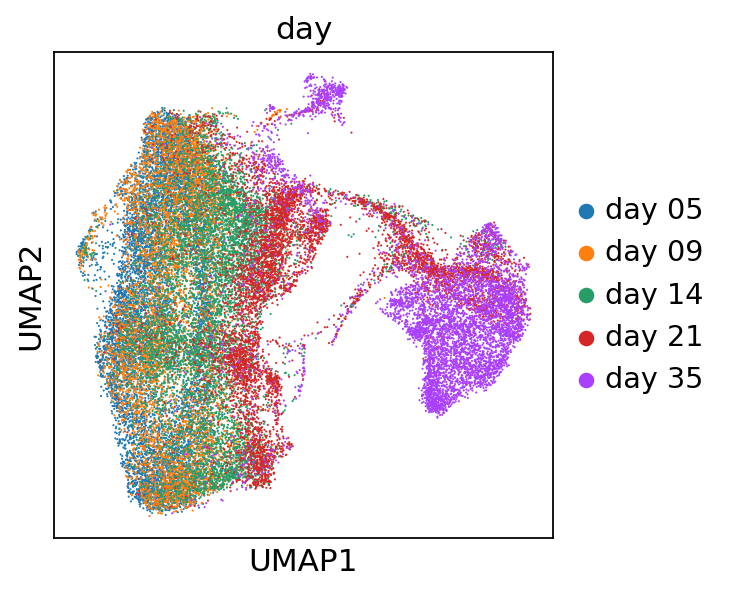

In [166]:
sc.pl.umap(adata, color='day')

In [15]:
### save 
#adata.write('all_dv_mistr_mnn.h5ad')

# read processed mnn adata

In [9]:
adata_mnn = sc.read_h5ad('all_dv_mistr_mnn.h5ad')
adata_mnn

AnnData object with n_obs × n_vars = 32962 × 16811
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'nCount_HTO', 'nFeature_HTO', 'HTO_maxID', 'HTO_secondID', 'HTO_margin', 'HTO_classification', 'HTO_classification.global', 'hash.ID', 'percent.mt', 'S.Score', 'G2M.Score', 'Phase', 'nCount_SCT', 'nFeature_SCT', 'SCT_snn_res.0.4', 'seurat_clusters', 'day', 'model', 'SCT_snn_res.0.3', 'tissue', 'source', 'initial_size_spliced', 'initial_size_unspliced', 'initial_size', 'chemistry', 'SCT_snn_res.0.5', 'SCT_snn_res.0.6', 'SCT_snn_res.0.8', 'batch'
    var: 'highly_variable', 'gene_ids', 'feature_types', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'highly_variable_nbatches'
    uns: 'day_colors', 'hvg', 'log1p', 'neighbors', 'umap'
    obsm: 'X_umap', 'fastmnn'
    layers: 'ambiguous', 'counts', 'log_transformed', 'spliced', 'unspliced'
    obsp: 'connectivities', 'distances'

## transfer processed information 

In [10]:
adata.obsm = adata_mnn.obsm.copy()
adata.uns['neighbors'] = adata_mnn.uns['neighbors']

## make a custom color map for plotting

In [11]:
from matplotlib.colors import LinearSegmentedColormap

# Define the custom colormap
colors = [(0.7, 0.7, 0.7), (1, 0, 1)]  # Light grey to purple
n_bins = 100  # Number of bins
cmap = LinearSegmentedColormap.from_list('custom_colormap', colors, N=n_bins)



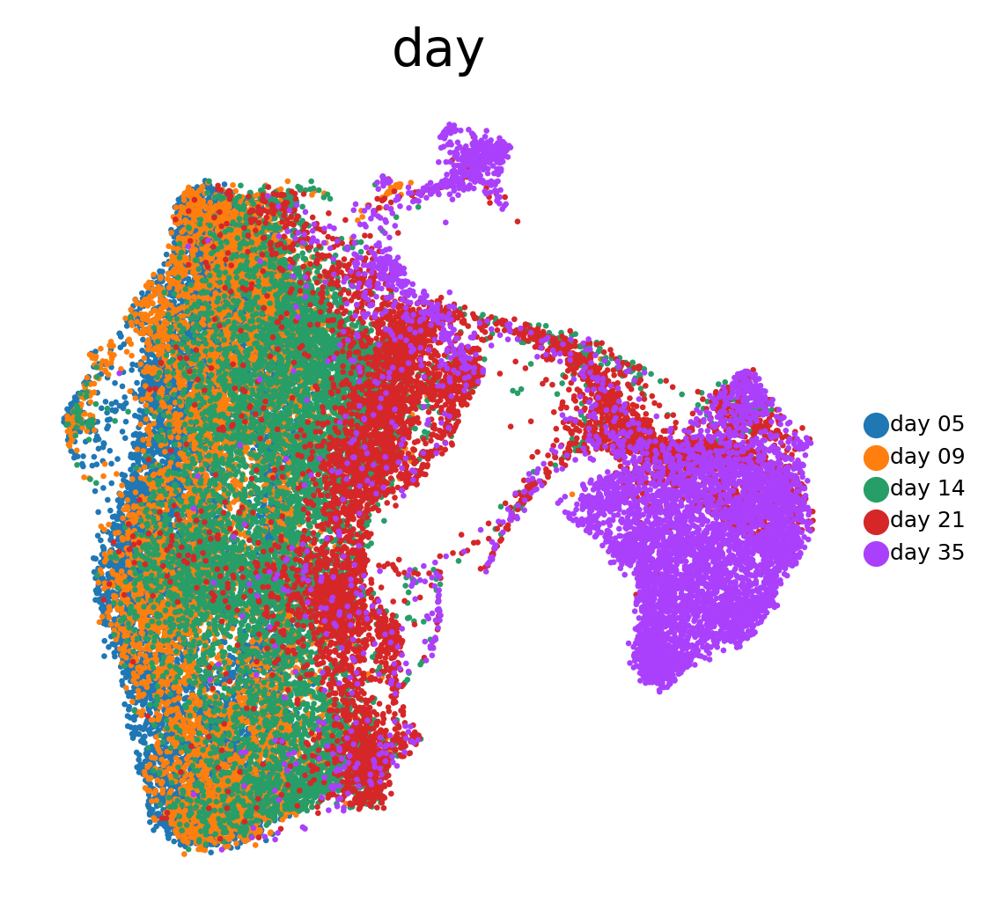

In [12]:
sc.pl.umap(adata, color = ['day'] , frameon= False, size = 10,save = 'dv_mistr_integrated' ,legend_fontsize=6)



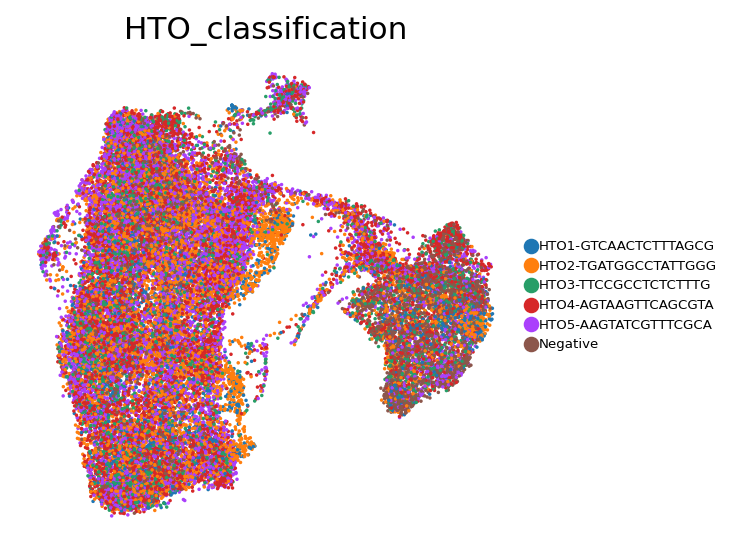

In [104]:
sc.pl.umap(adata, color = ['HTO_classification'] ,color_map= 'Spectral_r' ,frameon= False, size = 10 ,legend_fontsize=6)



In [148]:
#colors = ['PCDH10','PCDH19','GSX2','SST','FGF8',"SHH", "RAX", "SIX3", "IRX1", "POU3F1", "TCF7L2", "FOXA2", "OTX2",
# "FOXG1", "FEZF1", "ARX", "BARHL1", "DLK1", "DLX2", "SP9", "IRX3", "LHX2", "NKX2-1", "PAX6", 
# "SIX6", "GLI2", "EMX2", "VSX2", "FGF8", "NKX2-2", "GSX2", "OLIG2", "OTP", "SOX9", "FZD5"]

colors = ['DCX','SIX3','SIX6','GLI1','GLI3','PTCH1','PTCH2','SMO','TCF7L2,
DLX1
DLX5
DLX6-AS1
FOXD1
LHX6
LHX8
RAX
FEZF1
FEZF2
ZFHX3
BCL11B
]
for color in colors:
    sc.pl.umap(adata, color=color,size = 10,frameon=False, vmin = 0,show=False ,color_map='Spectral_r', save=f'{color}.svg')


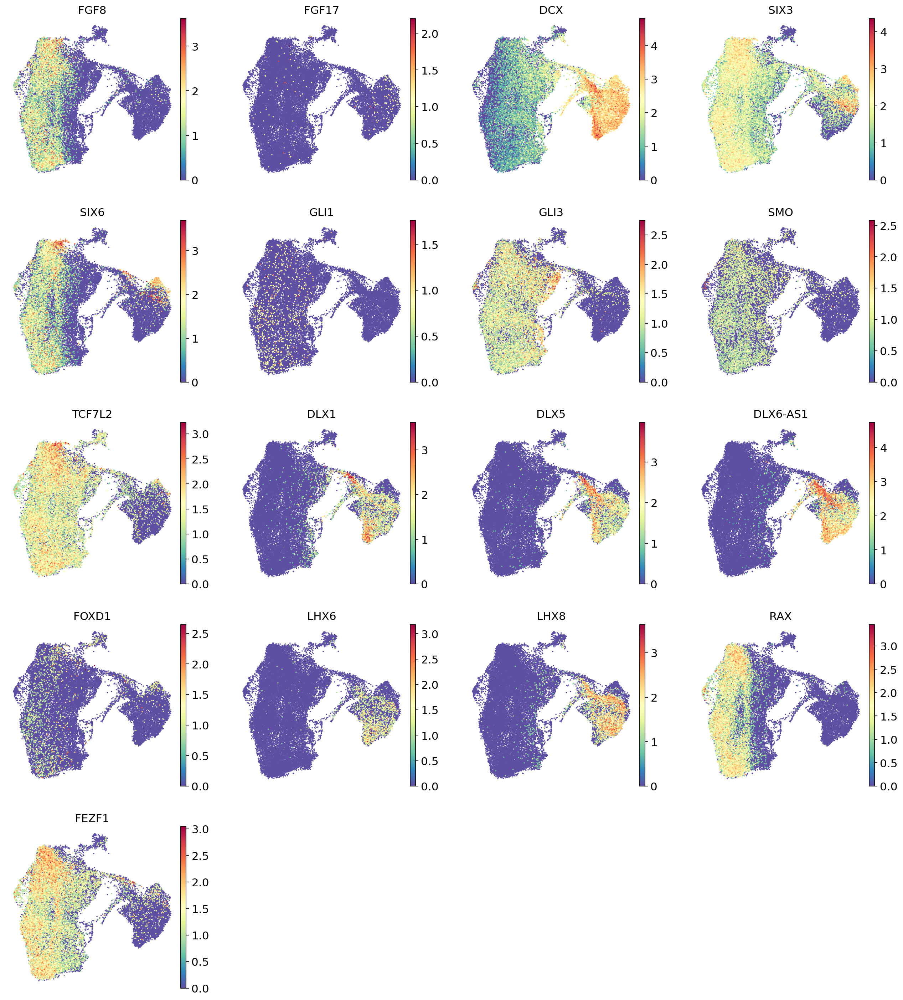

In [211]:
sc.pl.umap(adata, color = ['FGF8','FGF17','DCX','SIX3','SIX6','GLI1','GLI3','SMO',
                           'TCF7L2','DLX1','DLX5','DLX6-AS1','FOXD1','LHX6','LHX8','RAX','FEZF1'], color_map='Spectral_r',frameon= False, size = 10, ncols=4)

In [127]:
adata_to_save = adata.copy()

## compute the clusters

In [20]:
sc.pp.neighbors(adata, use_rep = 'fastmnn')
sc.tl.leiden(adata, resolution=2)

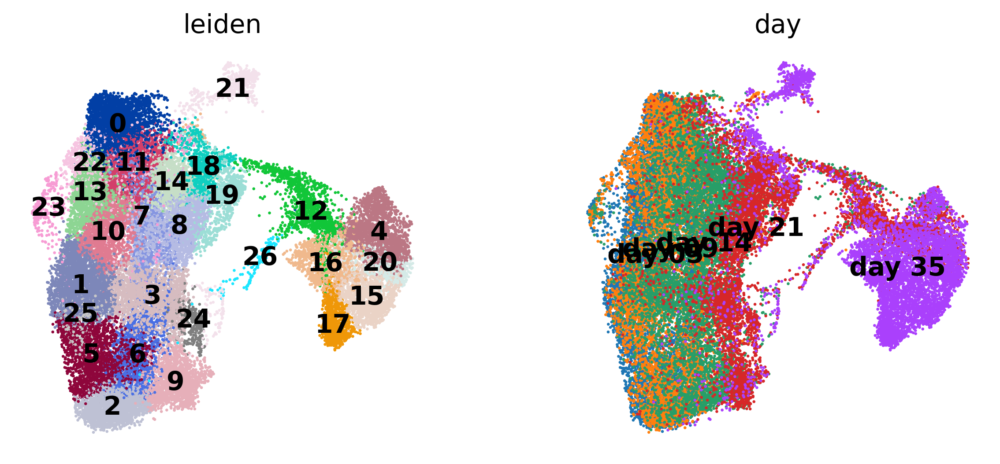

In [21]:
sc.pl.umap(adata, color = ['leiden','day'],legend_loc = 'on data' ,frameon= False, size = 10)

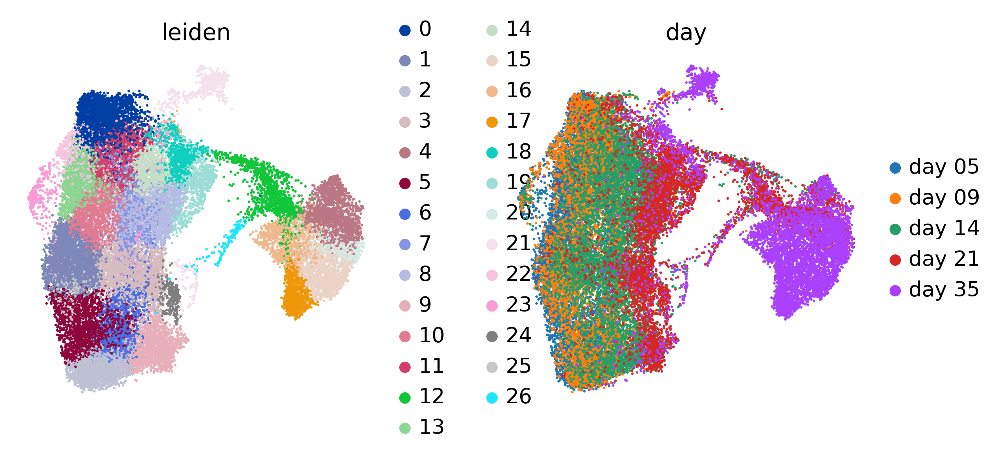

In [22]:
sc.pl.umap(adata, color = ['leiden','day'] ,frameon= False, size = 10)

In [24]:
#cluster '0','22','13','10','11','1','25','5','2','6','7' do not add any value as they are very early time point neuroepithelium
adata.obs['leiden'] = adata.obs['leiden'].astype('str').astype('category')

# Merge clusters 0, 1, 2, 3 into 0
clusters_to_merge = ['0','22','13','10','11','1','25','5','2','6','7']
adata.obs['leiden'][adata.obs['leiden'].isin(clusters_to_merge)] = '0'

# Reset colors in adata.uns['leiden_colors']
#adata.uns['leiden_colors'] = None

# Get unique categories and sort them
unique_categories = np.unique(adata.obs['leiden'])
sorted_categories = np.sort(unique_categories)

# Create a mapping to renumber clusters
cluster_mapping = {cluster: str(i) for i, cluster in enumerate(sorted_categories)}

# Apply the renumbering to the 'leiden' column
adata.obs['leiden'] = adata.obs['leiden'].map(cluster_mapping).astype('category')


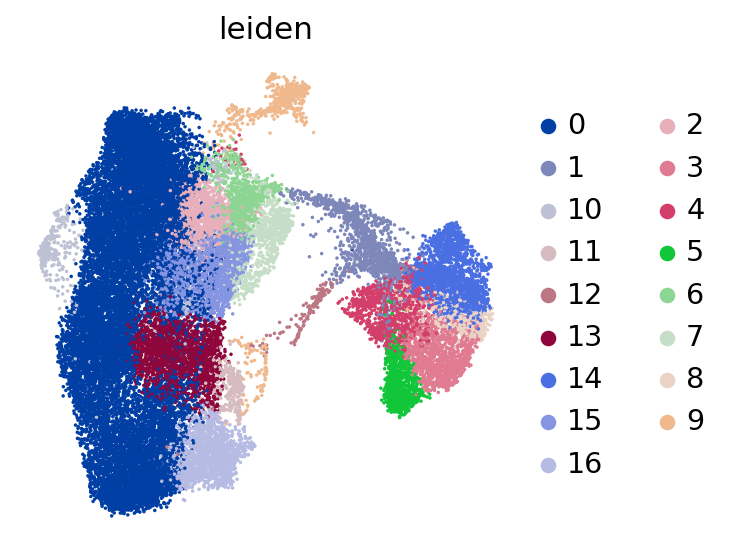

In [25]:
sc.set_figure_params(dpi_save=300)
sc.pl.umap(adata, color=['leiden'], frameon=False, size=10, save='dv_mistr_clusters_legend_side.svg')

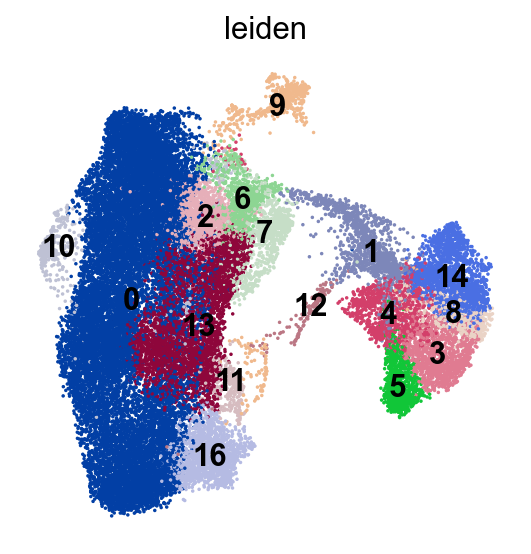

In [6]:
sc.set_figure_params(dpi_save=300)
sc.pl.umap(adata_to_save, color=['leiden'], legend_loc = 'on data',frameon=False, size=10)

In [7]:
### cluster 12 & 1 and 15 & 3 are very similar so lets merge them
clusters_to_merge = ['1','12']
adata_to_save.obs['leiden'][adata_to_save.obs['leiden'].isin(clusters_to_merge)] = '1'

clusters_to_merge = ['13','15']
adata_to_save.obs['leiden'][adata_to_save.obs['leiden'].isin(clusters_to_merge)] = '13'


### reorder the numbers 


# If you are still using the category dtype (for efficiency and consistency)
adata_to_save.obs['leiden'] = adata_to_save.obs['leiden'].astype('category')

# Reset the color mapping in adata.uns['leiden_colors'] if necessary
# adata_to_save.uns['leiden_colors'] = None  # Uncomment if you want to reset colors

# Get unique categories and sort them (this will reorder the clusters)
unique_categories = np.unique(adata_to_save.obs['leiden'])
sorted_categories = np.sort(unique_categories)

# Reassign numeric (or string) values to the clusters
cluster_mapping = {cluster: str(i) for i, cluster in enumerate(sorted_categories)}

# Apply the renumbering to the 'leiden' column (this will ensure proper relabeling)
adata_to_save.obs['leiden'] = adata_to_save.obs['leiden'].map(cluster_mapping).astype('category')

# Print the updated unique labels (just to check)
print(adata_to_save.obs['leiden'].unique())

['0', '4', '2', '7', '6', ..., '9', '5', '13', '8', '10']
Length: 15
Categories (15, object): ['0', '1', '10', '11', ..., '6', '7', '8', '9']


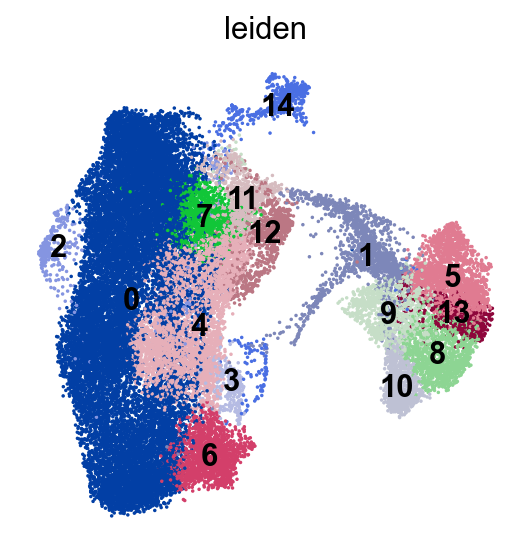

In [8]:
sc.set_figure_params(dpi_save=300)
sc.pl.umap(adata_to_save, color=['leiden'], legend_loc = 'on data',frameon=False, size=10)

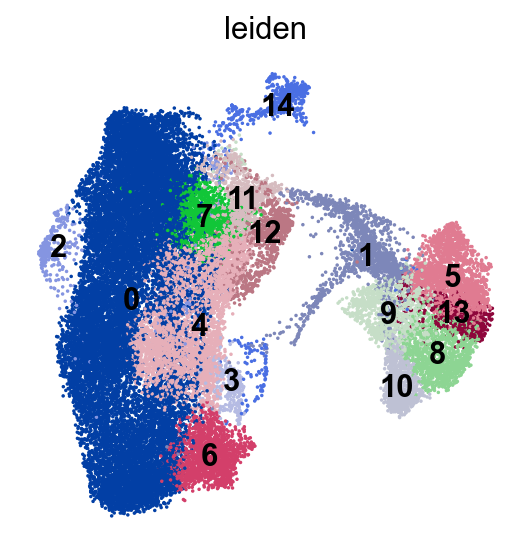

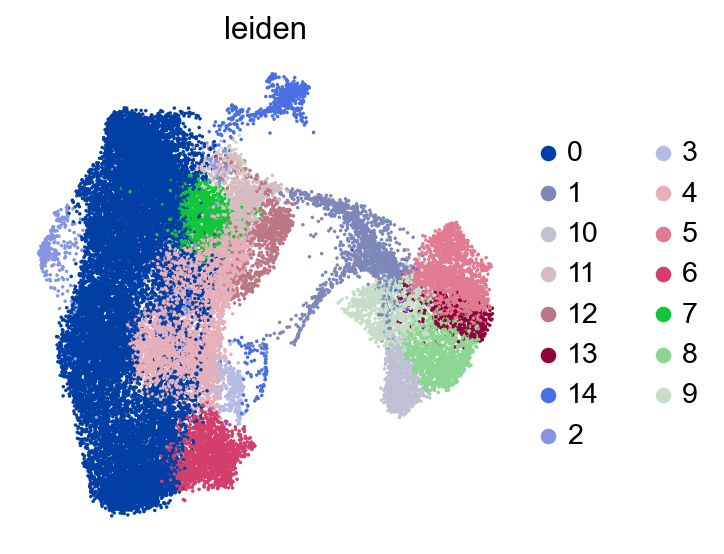

In [9]:
### plot ### 
sc.pl.umap(adata_to_save, color=['leiden'], frameon=False,legend_loc ='on data', size=10, save = 'dv_mistr_clusters_merged_legends_on_top.svg')
sc.pl.umap(adata_to_save, color=['leiden'], frameon=False, size=10, save = 'dv_mistr_clusters_merged_legends_right_side.svg')

In [15]:
ligand_dict = {
    'WNT': ['WNT2B', 'WNT3', 'WNT3A', 'WNT4', 'WNT5A', 'WNT5B',
            'WNT7A', 'WNT7B', 'WNT8A', 'WNT8B', 'WNT10A', 'WNT10B', 'WNT11'],
    'SFRP': ['SFRP1', 'SFRP2', 'SFRP4', 'SFRP5'],
    'RSPO': ['RSPO1', 'RSPO2', 'RSPO3', 'RSPO4'],
    'FGF': ['FGF1', 'FGF2', 'FGF3', 'FGF5', 'FGF7', 'FGF8',
            'FGF9', 'FGF10','FGF11','FGF12','FGF13','FGF14', 'FGF17', 'FGF18', 'FGF19', 'FGF20',
            'FGF22', 'FGF23'],
    'BMP': ['BMP1', 'BMP2', 'BMP3', 'BMP4', 'BMP5', 'BMP6', 'BMP7',
            'BMP8B'],
    'GDF': ['GDF3', 'GDF5', 'GDF6', 'GDF7', 'GDF9', 'GDF10',
            'GDF11', 'GDF15', 'MSTN'],
    'LIF': ['LIF', 'BDNF', 'GDNF', 'VEGFA', 'VEGFB', 'SHH',
            'FST', 'NTF3', 'IGF1', 'NPTX2', 'PTX3', 'MDK', 'EGF'],
    'STRA': ['STRA6', 'RBP4', 'RDH10', 'CYP26A1'],
    'SLIT': ['SLIT1', 'SLIT2', 'SLIT3', 'CXCL12'],
    'PORCN': ['PORCN', 'DKK1'],
    'PDGF': ['PDGFA', 'PDGFB', 'PDGFC', 'PDGFD', 'CNTF'],
    'TG': ['TGFA', 'TGFB1', 'TGFB2', 'TGFB3', 'LEFTY1', 'LEFTY2',
           'INHBB', 'INHBE', 'NODAL'],
    'JAG': ['JAG1', 'JAG2', 'DLL1', 'DLL3', 'DLL4', 'DLK1'],
}

In [16]:
new_receptor_dict = {
    'LGR': ['LGR4', 'LGR5', 'LGR6', 'LRP5', 'LRP6'],
    'FZD': ['FRZB', 'FZD1', 'FZD2', 'FZD3', 'FZD4', 'FZD5', 'FZD6', 'FZD7', 'FZD8', 'FZD9', 'FZD10'],
    'SMO': ['SMO', 'PTCH1', 'PTCH2', 'GLI1', 'GLI2', 'GLI3'],
    'BMP': ['BMPR1A', 'BMPR1B', 'BMPR2', 'TGFBR1', 'TGFBR2', 'TGFBR3', 'TGFBR3L', 'ALK', 'ACVR1', 'ACVR1B', 'ACVR1C', 'ACVR2A', 'ACVR2B'],
    'FGF': ['FGFR1', 'FGFR2', 'FGFR3', 'FGFR4', 'SPRY1', 'SPRY2', 'SPRY3', 'SPRY4'],
    'NTRK': ['NTRK1', 'NTRK2', 'NTRK3', 'NGFR', 'CNTFR',],
    'EGFR': ['GFRA1', 'GFRA2', 'GFRA3', 'RET', 'CRABP1', 'CRABP2'],
    'PDGF': ['PDGFRA', 'PDGFRB'],
    'TNFR': ['FLT1', 'FLT3', 'FLT4', 'LIFR', 'EGFR', 'SORT1', 'IGF1R'],
    'CXCR': ['CXCR2', 'CXCR4'],
    'NOTCH': ['NOTCH1', 'NOTCH2', 'NOTCH3', 'NOTCH4']
}


In [18]:
sc.tl.dendrogram(adata_to_save, use_rep = 'fastmnn', groupby= 'leiden')

categories: 0, 1, 10, etc.
var_group_labels: LGR, FZD, SMO, etc.


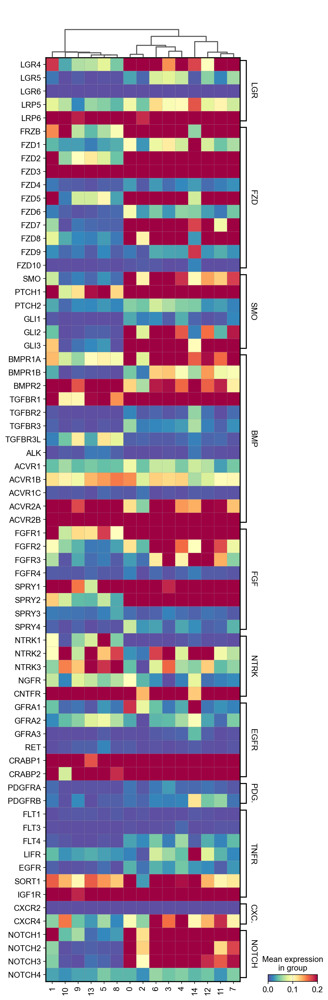

In [19]:
sc.pl.matrixplot(adata_to_save, new_receptor_dict, groupby='leiden', cmap='Spectral_r', swap_axes=True,vmax=0.2,save = 'DV_mistr_receptors_matrixplot.svg', dendrogram=True)

categories: 0, 1, 10, etc.
var_group_labels: WNT, SFRP, RSPO, etc.


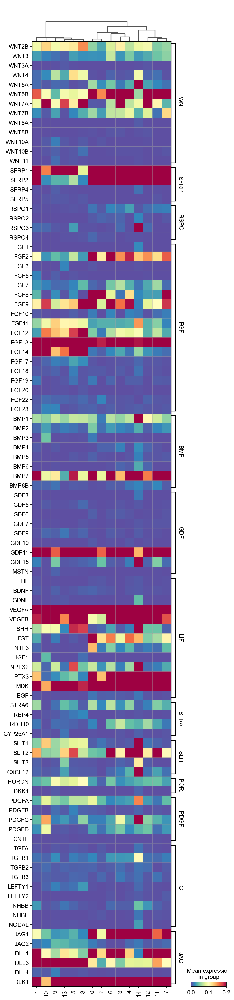

In [21]:
sc.pl.matrixplot(adata_to_save, ligand_dict, groupby='leiden', cmap='Spectral_r', swap_axes=True,vmax=0.2,save = 'DV_mistr_ligands_matrixplot.svg', dendrogram=True)